<a href="https://colab.research.google.com/github/Hanane-Derbak/Hanane-Derbak/blob/main/Copie_de_breast_cancer_Janvier_2026.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Projet data science initial
##Détection du cancer du sein via CNNs : Sciences des données appliquées

##Préparation de l'environnement
*on commence par l'importation des bibliothèques et le réglage de l'accélérateur matériel:*
* Outils : TensorFlow, Keras, NumPy, Matplotlib.
* Action : Activer le GPU T4 dans Google Colab pour accélérer l'entraînement.

###Readme.md, c'est un fichier explicatif qui accompagne un projet:
* Explique ce que fait le projet
* Dire comment l'installer et l'utiliser
* Décrire la structure du projet
* Donner des infos importantes (auteur, etc)

In [ ]:
import tensorflow as tf # Bibliothèque principale pour la création et l'entraînement de modèles de Deep Learning
from tensorflow.keras import layers, models # Importation des outils pour construire les couches (Conv2D, Dense) et la structure (Sequential)
from tensorflow.keras.utils import plot_model # Outil pour générer un schéma visuel de l'architecture de votre réseau de neurones
import matplotlib.pyplot as plt # Bibliothèque pour tracer les graphiques (Accuracy, Loss) et afficher les images médicales
import numpy as np # Outil de calcul numérique pour manipuler les données (tableaux d'images et de labels)
from sklearn.metrics import classification_report # Outil pour calculer la Précision, le Rappel (Recall) et le F1-Score
from sklearn.metrics import confusion_matrix # Importation spécifique pour créer la matrice de confusion
import seaborn as sns # Bibliothèque de visualisation pour rendre la matrice de confusion plus lisible et esthétique
import os # Bibliothèque pour interagir avec le système d'exploitation (gestion des dossiers et des fichiers d'images)


##Chargement du Dataset
###Importation de fichiers locaux
Cette cellule permet de charger un fichier (CSV, image, etc.) directement depuis l'ordinateur vers l'environnement Colab.

1. **Exécutez** la cellule.
2. **Cliquez** sur "Choisir des fichiers".
3. **Sélectionnez** le dossier/document en question.

In [ ]:
from google.colab import files # Importe la bibliothèque nécessaire
files.upload()               # Ouvre une fenêtre pour choisir un fichier a partir de PC
#from google.colab import drive
#drive.mount('/content/drive')

Saving archive.zip to archive (1).zip


{'archive (1).zip': b'PK\x03\x04-\x00\x00\x08\x08\x00\x15\x8e{VFd\xa0\x06\xff\xff\xff\xff\xff\xff\xff\xff\x11\x00\x14\x00Data/Cancer/1.jpg\x01\x00\x10\x00\x84\x12\x00\x00\x00\x00\x00\x00\xef\x0f\x00\x00\x00\x00\x00\x00\x9d\x97gXS[\x97\xc7O\n\x84\xd0\xa4$\xd4\xd0#\x84\xa0\x08\x81((H\x00i\x91\x1aB\x15\x1b %\x01\xa5I\xb1`\x10\xb1D\xa4\x83\x12 \x06\xa5\x84\x0eR\x14\x11\x05\x95"\x90K\tMD\x05\x0c ""\xd5v\xd5\xc1;3wf\xae\xdey\xde\xfb\xae\xf3\xfc?\xed\xf5\xacs~k\xed\xbd\xd6>\xdfG\xbfO\x00bDK\x1bK\x00\x04\x02\x00\xd0\xc6\x03|\x7f\x06\x98\x03\x02\xfc\xfc0~>\x01\x18\x0c\x06\x87\x0b\x08\n#D\x84\x85\x84\x84e%$7!\x14\xe4\x94\x14\x15\xe4P(e\xb4\xb6\x86\xb2\xea\x165\x14\n\xb3Cs\x8b\x8e\xae\xbe\xbe\xbe\x92\x86\xa1\xb1\x01\xceH[O\x1f\xf7#\x08\x08\x0e\x87\x0b\x0b\t\xcb\x88\x88\xc8\xe0TP*\xb8\x7fl\xdf[\x00q\x01P\x00\xd0\x03\x01\xa9\x02`q\x10D\x1c\xf4\xfd1\xa0\xb4\xf1\x9d|\xa0?\x0c\xf8/\x03\x81!P>~\x98\x00\\Ph\xc3\xa1^\x0c\x00\x83 \x100\x14\xc2\xc7\x07\x85n\xac\x9e\xdeX\x07\xa0\xe2|\x12*\xba\xa6\xfc\x92N\x

##Extraction du jeu de données (Dataset)

In [ ]:
import zipfile # Importation de la bibliothèque permettant de manipuler les fichiers compressés (.zip)

# Ouverture du fichier 'archive.zip' en mode lecture ('r' pour read)
with zipfile.ZipFile('archive.zip', 'r') as zip_ref:
    # Extraction de tout le contenu du fichier ZIP vers le dossier racine de Colab '/content/'
    zip_ref.extractall('/content/')


##Vérification de l'arborescence des données
###Validation de la structure du Dataset

In [ ]:
import os # Importation du module permettant d'interagir avec le système de fichiers (créer, supprimer, lister des dossiers)

# Liste le contenu du dossier '/content/Data' pour confirmer la présence des sous-dossiers de classes (ex: Cancer, Negative)
# pour confirmer l'organisation des classes
# Cela permet de s’assurer que l’extraction a été effectuée au bon endroit.
os.listdir('/content/Data')

['Negative', 'Cancer']

In [ ]:
!ls /content/Data/Cancer | wc -l
!ls /content/Data/Negative | wc -l

410
410


##Chargement et Standardisation du Dataset

In [ ]:
# Création d'un objet dataset à partir des images stockées dans les dossiers
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/Data",           # Chemin vers le dossier racine contenant les sous-dossiers de classes
    image_size=(224, 224),     # Redimensionnement automatique de toutes les images en 224x224 pixels
    batch_size=32,             # Groupement des images par paquets de 32 pour optimiser la mémoire du CPU/GPU
    label_mode='binary'        # Mode binaire (0 ou 1) car nous n'avons que deux classes : Normal ou Cancer
    #Ce paramètre dit à TensorFlow : "Il n'y a que deux options possibles". Cela prépare le terrain pour la fonction de perte binary_crossentropy que vous avez configurée plus bas.
)

Found 820 files belonging to 2 classes.


In [ ]:
print(dataset)



<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 1), dtype=tf.float32, name=None))>


##Création des jeux de données d'entraînement et de validation

In [ ]:
# Configuration du jeu d'entraînement (80% des données)
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/Data",         # Chemin vers le dossier contenant les images médicales
    validation_split=0.2,    # Réserve 20% des images pour le test (validation)
    subset="training",       # Indique que cet objet contient les 80% restants pour l'entraînement
    seed=123,                # Graine aléatoire pour assurer que le mélange soit identique à chaque lancement
    image_size=(224,224),    # Redimensionne toutes les images à une taille uniforme de 224x224 pixels
    batch_size=32            # Divise les données en paquets de 32 images pour le calcul
)

# Configuration du jeu de validation (20% des données)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/Data",         # Même chemin source
    validation_split=0.2,    # Même pourcentage de division
    subset="validation",     # Indique que cet objet contient uniquement les 20% réservés au test
    seed=123,                # Utilise la même graine (seed) pour ne pas mélanger les images du train et de la val
    image_size=(224,224),    # Taille identique pour la cohérence des données
    batch_size=32            # Taille de lot identique
)
#La Seed (123) : C'est l'un des points les plus importants, pour assurer la reproductibilité,
#En fixant seed=123, vous vous assurez que la séparation entre les images d'entraînement (80%) et de validation (20%) sera identique à chaque exécution.
#Sans cela, votre modèle pourrait "tricher" en testant sur des images qu'il a déjà vues lors d'une session précédente.
#par ex: Sans une seed identique, l'image n°10 pourrait se retrouver dans l'entraînement lors du premier essai et dans la validation au deuxième essai,
#ce qui rendrait vos résultats instables.

Found 820 files belonging to 2 classes.
Using 656 files for training.
Found 820 files belonging to 2 classes.
Using 164 files for validation.


##Normalisation et mise à l'échelle des pixels

In [ ]:
## On divise chaque pixel (0-255) par 255 pour obtenir une valeur entre 0 et 1
normalization = tf.keras.layers.Rescaling(1./255)
## Application de la normalisation sur l'ensemble d'entraînement et Validation
# La fonction .map() applique la transformation à chaque image (x) tout en gardant l'étiquette (y) intacte
train_ds = train_ds.map(lambda x, y: (normalization(x), y))
val_ds = val_ds.map(lambda x, y: (normalization(x), y))


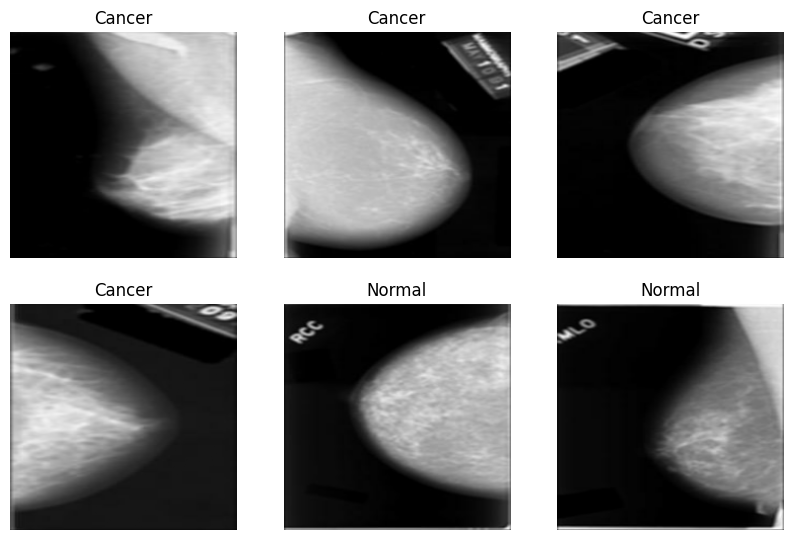

In [ ]:
plt.figure(figsize=(10,10))
for images, labels in train_ds.take(1):
    for i in range(6):
        ax = plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy())
        plt.title("Cancer" if labels[i]==1 else "Normal")
        plt.axis("off")
plt.show()


##Architecture du Réseau de Neurones Convolutif (CNN)

In [ ]:
# Définition du modèle séquentiel (les couches s'empilent les unes après les autres)
model = models.Sequential([
    # 1ère couche de convolution : détecte les formes de base (bords, lignes) avec 32 filtres
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(224,224,3)),
    # Réduit la taille de l'image par 2 pour ne garder que les informations les plus importantes
    layers.MaxPooling2D(2,2),

    # 2ème couche de convolution : détecte des motifs plus complexes (textures)
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(2,2),

    # 3ème couche de convolution : détecte des structures spécifiques aux cellules
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D(2,2),

    # Transformation de la matrice 2D en un long vecteur plat pour les couches denses
    layers.Flatten(),

    # Couche de neurones classique pour interpréter les caractéristiques extraites
    layers.Dense(64, activation='relu'),

    # Couche de sortie : 1 neurone avec 'sigmoid' pour donner une probabilité entre 0 et 1 (Cancer vs Sain)
    layers.Dense(1, activation='sigmoid')  # Indispensable pour la classification binaire
])


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


##Compilation du Modèle

In [ ]:
#model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),

# Configuration de la méthode d'apprentissage
model.compile(
    optimizer='adam',               # Algorithme qui ajuste les poids pour réduire l'erreur rapidement
    loss='binary_crossentropy',    # Fonction de perte spécifique pour mesurer l'erreur en classification binaire
    metrics=['accuracy']           # Nous suivons le taux de précision pendant l'entraînement
)

# Affichage du tableau récapitulatif de l'architecture (nombre de paramètres à entraîner)
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │     5,537,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,631,169 (21.48 MB)

 Trainable params: 5,631,169 (21.48 MB)

 Non-trainable params: 0 (0.00 B)

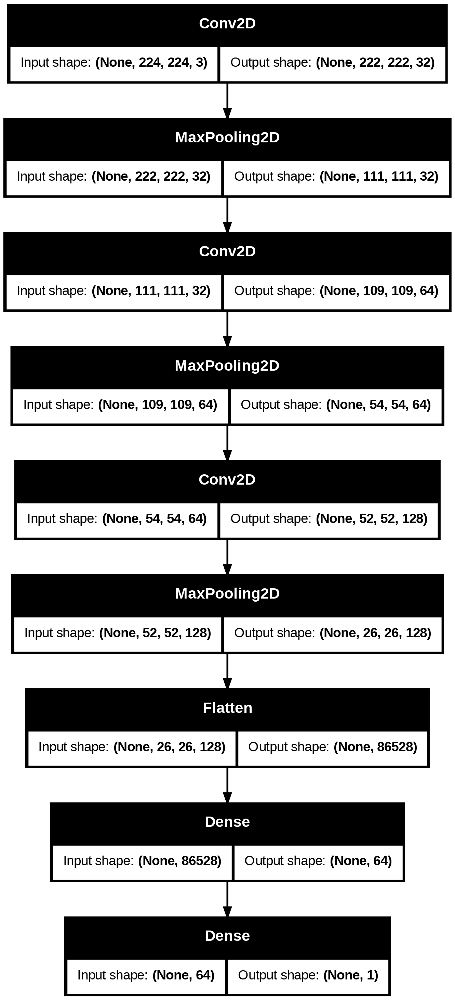

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=False)

In [ ]:
epochs = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - accuracy: 0.6099 - loss: 0.7184 - val_accuracy: 0.8415 - val_loss: 0.4240
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - accuracy: 0.9073 - loss: 0.3053 - val_accuracy: 0.8659 - val_loss: 0.3651
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - accuracy: 0.9183 - loss: 0.2194 - val_accuracy: 0.8354 - val_loss: 0.3694
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - accuracy: 0.9450 - loss: 0.1756 - val_accuracy: 0.9085 - val_loss: 0.2618
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - accuracy: 0.9746 - loss: 0.0901 - val_accuracy: 0.9268 - val_loss: 0.2221
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - accuracy: 0.9716 - loss: 0.0832 - val_accuracy: 0.8720 - val_loss: 0.3336
Epoch 7/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.9598 - loss: 0.1165 - val_accuracy: 0.9329 - val_loss: 0.2842
Epoch 8/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - accuracy: 0.9786 - loss: 0.0551 - val_accuracy: 0.9085 - 

#Conv
##Pooling
###flatten

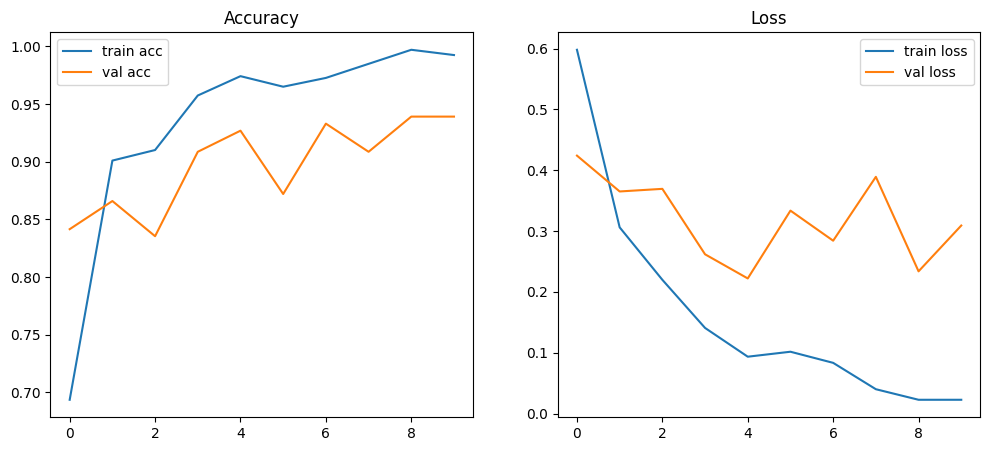

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(acc, label='train acc')
plt.plot(val_acc, label='val acc')
plt.legend()
plt.title('Accuracy')

plt.subplot(1,2,2)
plt.plot(loss, label='train loss')
plt.plot(val_loss, label='val loss')
plt.legend()
plt.title('Loss')
plt.show()


##Interprétation des resultats
Le modèle apprend correctement, mais l’écart train/validation montre un overfitting modéré: il est trop spécialisé sur l’entraînement et moins performant sur la validation.

Pour améliorer la généralisation, On pourra :

* Ajouter plus de données d’entraînement.

* Utiliser régularisation (dropout, L2…).

* Arrêter l’entraînement plus tôt : Early stopping pour stopper quand val acc ne s’améliore plus.

In [ ]:
# 1. Extraction des images et des labels en restant synchronisé
# On crée des listes vides pour stocker les lots (batches) de données
all_images = []
all_labels = []

# On boucle sur le dataset de validation pour récupérer chaque paquet d'images et ses étiquettes
for images, labels in val_ds:
    all_images.append(images) # Ajoute le lot d'images à la liste
    all_labels.append(labels) # Ajoute le lot de labels correspondants

# Conversion des listes de lots en deux grands tableaux NumPy (nécessaire pour Scikit-Learn)
x_val = np.concatenate(all_images, axis=0) # Regroupe toutes les images en un seul bloc
y_true = np.concatenate(all_labels, axis=0) # Regroupe tous les labels réels (la vérité terrain)

# 2. Prédiction sur les images extraites
# Le modèle donne une probabilité entre 0 et 1 pour chaque image
y_pred_prob = model.predict(x_val)
# Seuil de décision : si proba > 0.5 alors 'Cancer' (1), sinon 'Normal' (0)
y_pred = (y_pred_prob > 0.5).astype(int)

# Affichage du rapport complet (Précision, Rappel, F1-Score)
print(classification_report(y_true, y_pred, target_names=['Normal', 'Cancer']))


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step
              precision    recall  f1-score   support

      Normal       0.99      0.90      0.94        86
      Cancer       0.90      0.99      0.94        78

    accuracy                           0.94       164
   macro avg       0.94      0.94      0.94       164
weighted avg       0.94      0.94      0.94       164



##Interprétation des resultats
Le modèle affiche une excellente performance avec une précision globale de 94 % (Accuracy). Il est particulièrement fiable pour le diagnostic médical car il parvient à identifier la quasi-totalité des cas de cancer présents dans l'échantillon.
par ex. Classe "Cancer" (Priorité médicale) : Le modèle possède un Recall (Rappel) de 99%. Cela signifie qu'il ne laisse passer que 1 % des cas réels (très peu de faux négatifs), ce qui est l'objectif critique en santé. Sa précision de 90% indique que lorsqu'il diagnostique un cancer, il a raison 9 fois sur 10.

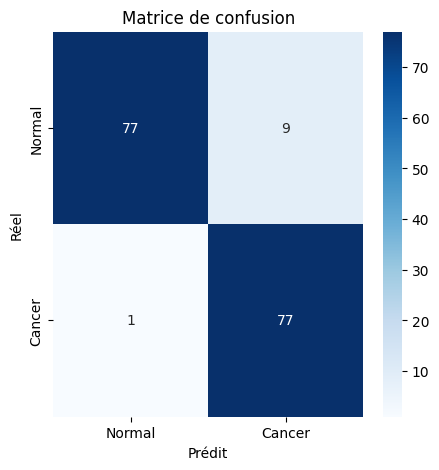

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal','Cancer'], yticklabels=['Normal','Cancer'])
plt.xlabel('Prédit')
plt.ylabel('Réel')
plt.title('Matrice de confusion')
plt.show()


##Interprétation des resultats
* Vrais Négatifs (77) : Le modèle a prédit "Normal" pour 77 images qui étaient réellement saines. C'est une bonne performance.

* Vrais Positifs (77) : Le modèle a correctement identifié 77 cas de "Cancer". C'est le score le plus important.

* Faux Positifs (9) : Le modèle a dit Cancer pour 9 fois. C'est une erreur de "fausse alerte".

* Faux Négatifs (1) : Le modèle a dit "Normal" pour 1 image qui était en fait un cancer. Le score est excellent ici (seulement 1 erreur).